In [1]:
import repath.data.datasets.bloodmucus as bloodm

dset = bloodm.training()

In [2]:
slide_path, annot_path, _, _ = dset[0]
with dset.slide_cls(dset.root / slide_path) as slide:
    thumb = slide.get_thumbnail(5)

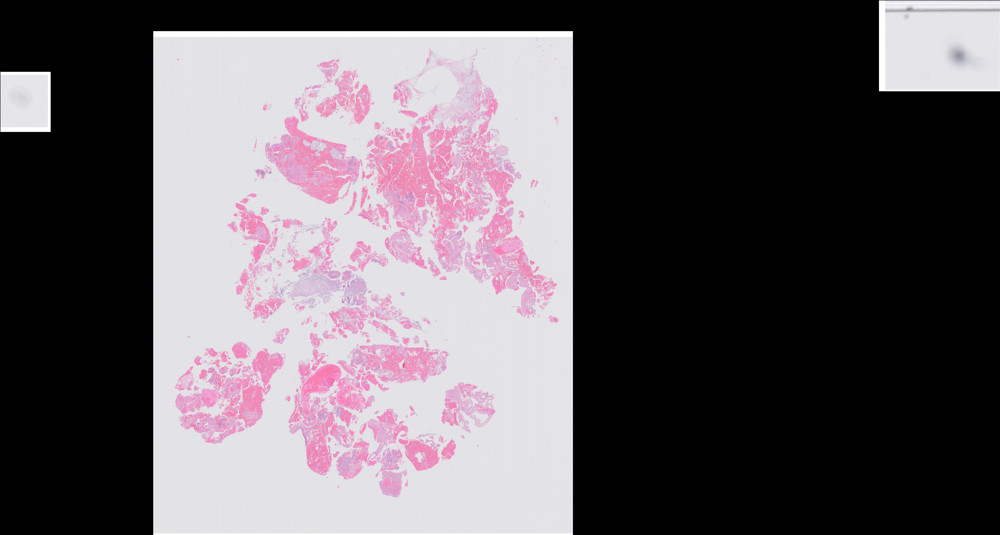

In [3]:
from PIL import Image

Image.fromarray(thumb)

In [4]:
import numpy as np

M_mat = np.array([[0.65, 0.7, 0.29], [0.07, 0.99, 0.11], [0.27, 0.57, 0.78]])
M_mat.shape

(3, 3)

In [5]:
D_mat = np.linalg.inv(M_mat)
D_mat

array([[ 1.87798274, -1.00767869, -0.55611582],
       [-0.06590806,  1.13473037, -0.1355218 ],
       [-0.60190736, -0.48041419,  1.57358807]])

In [6]:
from repath.preprocess.tissue_detection import TissueDetectorGreyScale, SizedClosingTransform, FillHolesTransform
from repath.preprocess.tissue_detection.blood_mucus_rework import set_background_to_white

# define tissue detector
morphology_transform1 = SizedClosingTransform(level_in=5)
morphology_transform2 = FillHolesTransform(level_in=5)
morphology_transforms = [morphology_transform1, morphology_transform2]
tissue_detector = TissueDetectorGreyScale(grey_level=0.85, morph_transform = morphology_transforms)

thumb_white = set_background_to_white([thumb], tissue_detector)

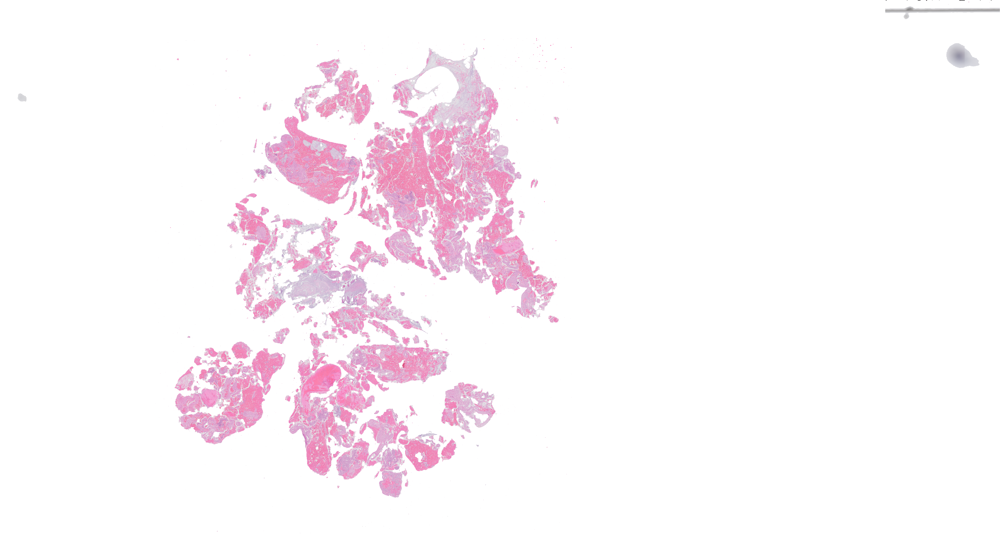

In [7]:
Image.fromarray(thumb_white[0])

In [8]:
im = thumb_white[0]
im.shape

(2526, 4718, 3)

https://github.com/DigitalSlideArchive/HistomicsTK/blob/master/histomicstk/preprocessing/color_deconvolution/color_deconvolution.py

In [9]:
im_rgb = im.reshape((-1, im.shape[-1])).T
im_rgb.shape

(3, 11917668)

In [21]:
I_0 = 226
im_rgb = im_rgb.astype(float) + 1
im_sda = -np.log(im_rgb/(1.* I_0)) * 255/np.log(I_0)
im_sda.shape

(3, 11917668)

In [22]:
np.max(im_sda)

222.3920505879004

In [23]:
w = np.array([[0.650, 0.072, 0], [0.704, 0.990, 0], [0.286, 0.105, 0]])
stain0 = w[:, 0]
stain1 = w[:, 1]
stain2 = np.cross(stain0, stain1)
wc = np.array([stain0, stain1, stain2 / np.linalg.norm(stain2)]).T
wc = wc / np.sqrt((wc ** 2).sum(0))
Q = np.linalg.inv(wc)
Q

array([[ 1.48907185, -0.1626479 ,  0.5124595 ],
       [-1.0822788 ,  1.1179259 , -0.29209304],
       [-0.33185688, -0.07559332,  0.94029605]])

In [24]:
sda_deconv = np.dot(Q, im_sda)
sda_deconv.shape

(3, 11917668)

In [25]:
stain_im = sda_deconv.T.reshape(im.shape[:-1] + (sda_deconv.shape[0],))
stain_im.shape

(2526, 4718, 3)

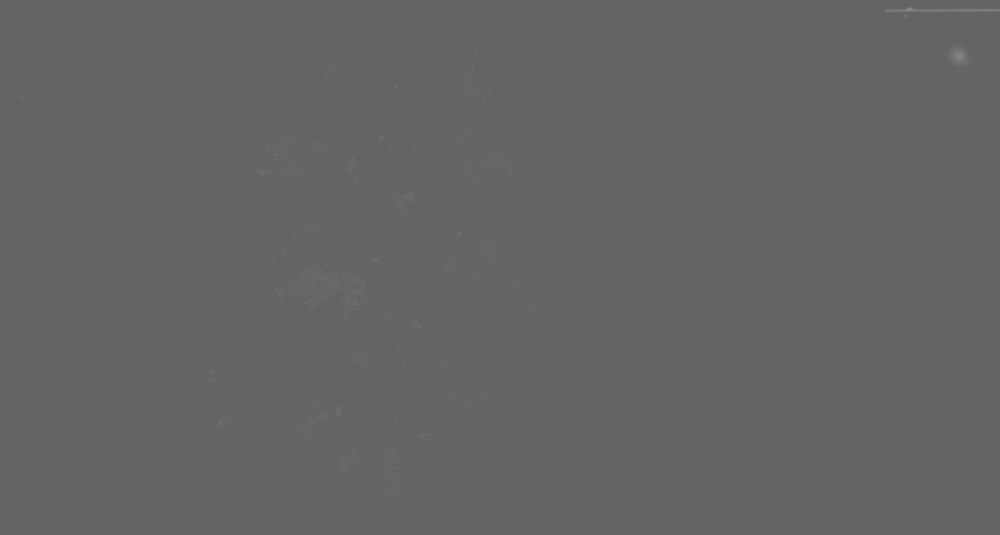

In [29]:
stain_out = stain_im.clip(0, 255).astype(np.uint8)
Image.fromarray(np.array(stain_out[:, :, 0]+100))

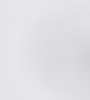

In [19]:
Image.fromarray(thumb[400:500, 10:100, :])

In [20]:
np.mean(thumb[400:500, 10:100, :])

226.29333333333332